# Image Upscaling

In [ ]:
import os
import math
import PIL
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from keras.applications import vgg16
from tensorflow.keras.preprocessing.image import load_img, array_to_img, img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from IPython.display import display

## By Training A Model

In [ ]:
url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"

data_path = tf.keras.utils.get_file(origin=url, untar=True, fname="BSR") # Downloads and extracts the filesystem
root_path = os.path.join(data_path, "BSDS500/data")

target_size = 300
upscale_factor = 3
input_size = target_size // upscale_factor
batch_size = 8

70763455/70763455 [==============================] - 1s 0us/step


In [ ]:
# Creates the Trainig and Validation datasets and sets image sizes to 256x256 by default
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    root_path,
    batch_size = batch_size,
    label_mode=None,
    image_size=(target_size, target_size),
    validation_split=0.2,
    subset="training",
    seed=1337
)

validate_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    root_path,
    batch_size = batch_size,
    label_mode=None,
    image_size=(target_size, target_size),
    validation_split=0.2,
    subset="validation",
    seed=1337
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


In [ ]:
# Scales the images so that each pixel value ranges from 0 to 1
def scale(img):
    return (img)/255.0

train_data = train_data_raw.map(scale)
validate_data = validate_data_raw.map(scale)

def process_input(img, target_size, upscale_factor):
    img = tf.image.rgb_to_yuv(img)
    y = tf.split(img, 3, axis = len(img.shape)-1)[0]
    return tf.image.resize(y, [target_size, target_size], method="area")


def process_target(img):
    img = tf.image.rgb_to_yuv(img) # Change the image format to yuv scale,
    return tf.split(img, 3, axis=len(img.shape)-1)[0]


In [ ]:
train_data_scaled = train_data.map(
    lambda img: (process_input(img, input_size, upscale_factor), process_target(img))
)

train_ds = train_data_scaled.prefetch(buffer_size=32)

validate_data_scaled = validate_data.map(
    lambda img: (process_input(img, input_size, upscale_factor), process_target(img))
)

valid_ds = validate_data_scaled.prefetch(buffer_size=32)

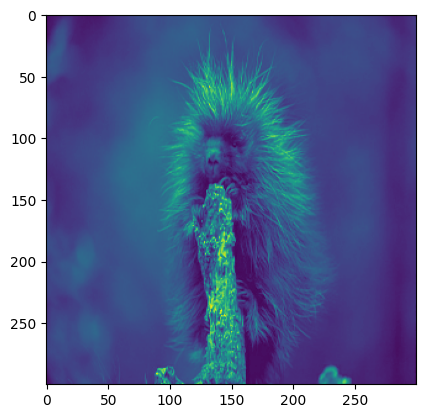

<Figure size 30000x30000 with 0 Axes>

(300, 300) 



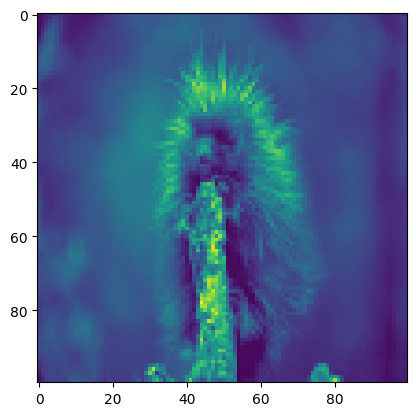

<Figure size 10000x10000 with 0 Axes>

(100, 100)


In [ ]:
l = list(train_ds)

img1 = tf.keras.preprocessing.image.array_to_img(l[0][1][0])
plt.imshow(img1)
plt.figure(figsize=(img1.size[0], img1.size[1]))
plt.show()
print(img1.size,"\n")

img2 = tf.keras.preprocessing.image.array_to_img(l[0][0][0])
plt.imshow(img2)
plt.figure(figsize=(img2.size[0], img2.size[1]))
plt.show()
print(img2.size)

In [ ]:
def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

In [ ]:
dataset = os.path.join(root_path, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [ ]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [ ]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    1664      
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 9)     2601      
                                                                 
 tf.nn.depth_to_space (TFOp  (None, None, None, 1)     0         
 Lambda)                                                         
                                                             

Epoch 1/150
Mean PSNR for epoch: 22.29
1/1 [==============================] - 0s 266ms/step


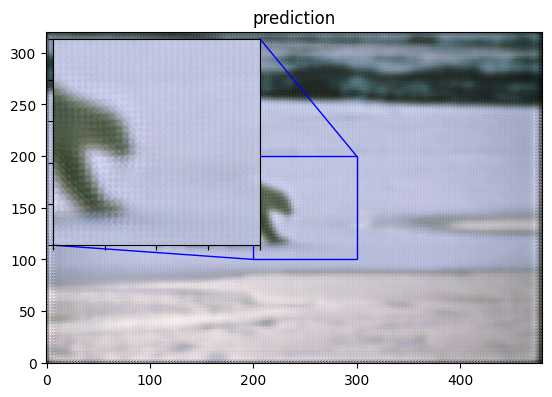

50/50 - 22s - loss: 0.0357 - val_loss: 0.0059 - 22s/epoch - 438ms/step
Epoch 2/150
Mean PSNR for epoch: 24.43
50/50 - 2s - loss: 0.0049 - val_loss: 0.0035 - 2s/epoch - 39ms/step
Epoch 3/150
Mean PSNR for epoch: 23.25
50/50 - 2s - loss: 0.0037 - val_loss: 0.0048 - 2s/epoch - 33ms/step
Epoch 4/150
Mean PSNR for epoch: 26.16
50/50 - 2s - loss: 0.0034 - val_loss: 0.0027 - 2s/epoch - 32ms/step
Epoch 5/150
Mean PSNR for epoch: 25.94
50/50 - 3s - loss: 0.0030 - val_loss: 0.0026 - 3s/epoch - 56ms/step
Epoch 6/150
Mean PSNR for epoch: 26.18
50/50 - 2s - loss: 0.0029 - val_loss: 0.0025 - 2s/epoch - 33ms/step
Epoch 7/150
Mean PSNR for epoch: 26.22
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 33ms/step
Epoch 8/150
Mean PSNR for epoch: 26.23
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 32ms/step
Epoch 9/150
Mean PSNR for epoch: 26.38
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 39ms/step
Epoch 10/150
Mean PSNR for epoch: 26.15
50/50 - 3s - loss: 0.0028 - val_l

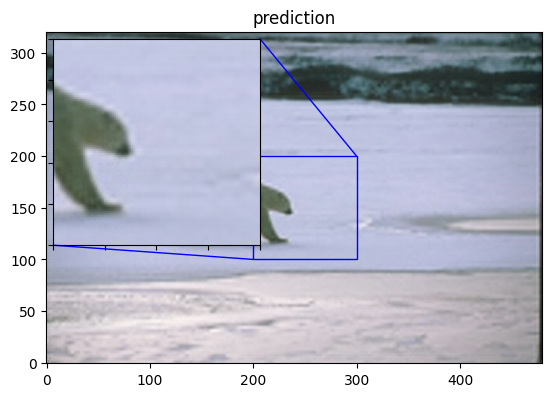

50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 46ms/step
Epoch 22/150
Mean PSNR for epoch: 26.25
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 38ms/step
Epoch 23/150
Mean PSNR for epoch: 26.62
50/50 - 3s - loss: 0.0027 - val_loss: 0.0023 - 3s/epoch - 59ms/step
Epoch 24/150
Mean PSNR for epoch: 26.68
50/50 - 2s - loss: 0.0027 - val_loss: 0.0023 - 2s/epoch - 39ms/step
Epoch 25/150
Mean PSNR for epoch: 26.98
50/50 - 2s - loss: 0.0028 - val_loss: 0.0024 - 2s/epoch - 31ms/step
Epoch 26/150
Mean PSNR for epoch: 26.26
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 32ms/step
Epoch 27/150
Mean PSNR for epoch: 27.20
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 34ms/step
Epoch 28/150
Mean PSNR for epoch: 26.55
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 33ms/step
Epoch 29/150
Mean PSNR for epoch: 26.64
50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 52ms/step
Epoch 30/150
Mean PSNR for epoch: 26.44
50/50 - 2s - loss: 0.0026 - 

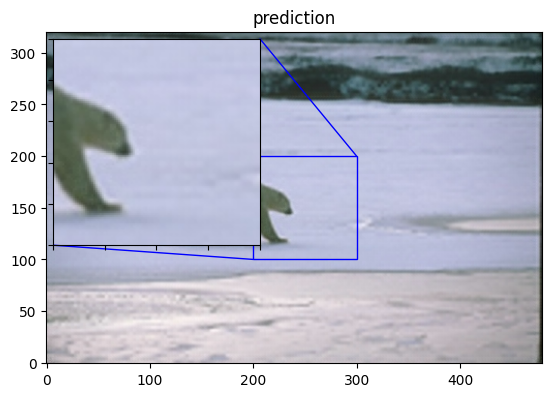

50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 56ms/step
Epoch 42/150
Mean PSNR for epoch: 26.70
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 32ms/step
Epoch 43/150
Mean PSNR for epoch: 26.83
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 32ms/step
Epoch 44/150
Mean PSNR for epoch: 26.85
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 40ms/step
Epoch 45/150
Mean PSNR for epoch: 26.46
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 59ms/step
Epoch 46/150
Mean PSNR for epoch: 26.24
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 39ms/step
Epoch 47/150
Mean PSNR for epoch: 26.53
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 32ms/step
Epoch 48/150
Mean PSNR for epoch: 26.33
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 32ms/step
Epoch 49/150
Mean PSNR for epoch: 26.52
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 33ms/step
Epoch 50/150
Mean PSNR for epoch: 26.40
50/50 - 2s - loss: 0.0025 - 

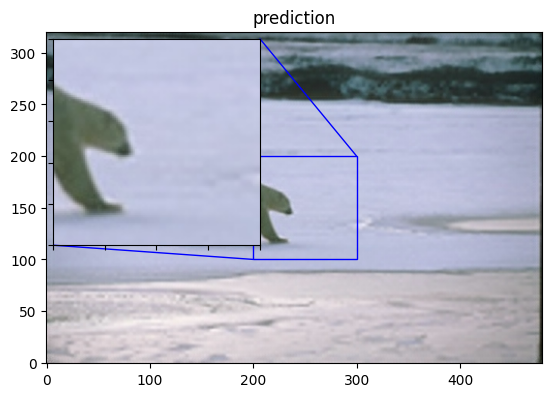

50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 46ms/step
Epoch 62/150
Mean PSNR for epoch: 26.25
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 61ms/step
Epoch 63/150
Mean PSNR for epoch: 26.35
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 64/150
Mean PSNR for epoch: 27.33
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 33ms/step
Epoch 65/150
Mean PSNR for epoch: 26.88
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 66/150
Mean PSNR for epoch: 26.40
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 67/150
Mean PSNR for epoch: 25.68
50/50 - 2s - loss: 0.0026 - val_loss: 0.0028 - 2s/epoch - 31ms/step
Epoch 68/150
Mean PSNR for epoch: 26.53
50/50 - 2s - loss: 0.0030 - val_loss: 0.0023 - 2s/epoch - 39ms/step
Epoch 69/150
Mean PSNR for epoch: 26.43
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 57ms/step
Epoch 70/150
Mean PSNR for epoch: 26.72
50/50 - 2s - loss: 0.0025 - 

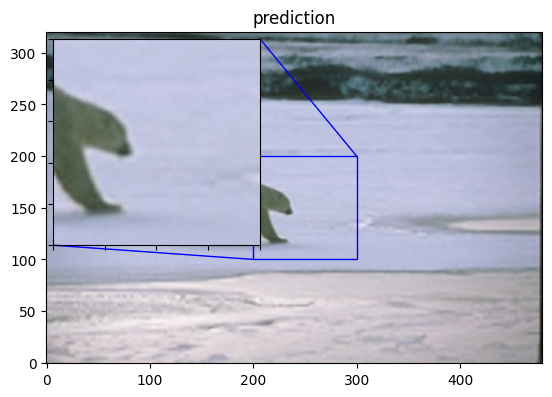

50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 46ms/step
Epoch 82/150
Mean PSNR for epoch: 26.63
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 83/150
Mean PSNR for epoch: 26.83
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 84/150
Mean PSNR for epoch: 26.69
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 85/150
Mean PSNR for epoch: 26.83
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 54ms/step
Epoch 86/150
Mean PSNR for epoch: 25.63
50/50 - 2s - loss: 0.0025 - val_loss: 0.0025 - 2s/epoch - 33ms/step
Epoch 87/150
Mean PSNR for epoch: 26.47
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 38ms/step
Epoch 88/150
Mean PSNR for epoch: 26.40
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 39ms/step
Epoch 89/150
Mean PSNR for epoch: 26.51
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 31ms/step
Epoch 90/150
Mean PSNR for epoch: 26.39
50/50 - 3s - loss: 0.0025 - 

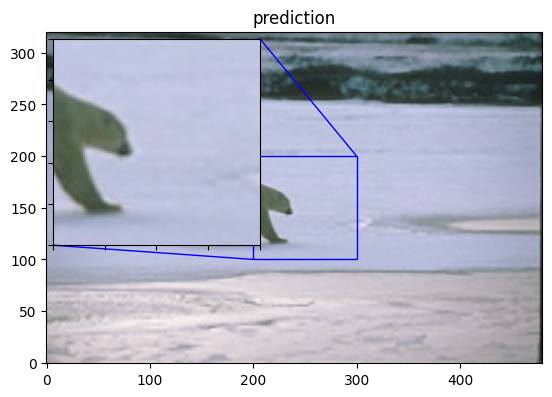

50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 50ms/step
Epoch 102/150
Mean PSNR for epoch: 26.61
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 103/150
Mean PSNR for epoch: 26.86
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 58ms/step
Epoch 104/150
Mean PSNR for epoch: 26.46
50/50 - 2s - loss: 0.0025 - val_loss: 0.0024 - 2s/epoch - 32ms/step
Epoch 105/150
Mean PSNR for epoch: 26.73
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 33ms/step
Epoch 106/150
Mean PSNR for epoch: 26.55
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 33ms/step
Epoch 107/150
Mean PSNR for epoch: 26.84
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 108/150
Mean PSNR for epoch: 26.40
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 44ms/step
Epoch 109/150
Mean PSNR for epoch: 26.40
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 57ms/step
Epoch 110/150
Mean PSNR for epoch: 27.30
50/50 - 2s - loss: 

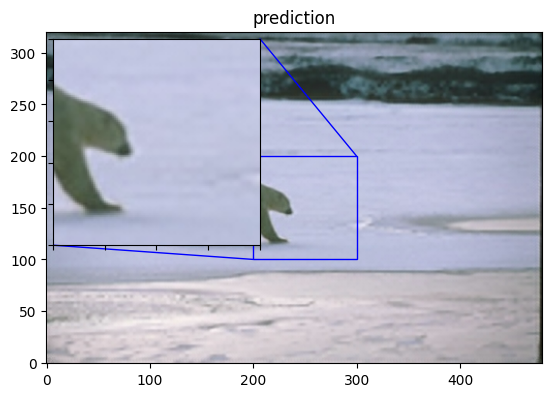

50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 46ms/step
Epoch 122/150
Mean PSNR for epoch: 26.72
50/50 - 3s - loss: 0.0024 - val_loss: 0.0022 - 3s/epoch - 62ms/step
Epoch 123/150
Mean PSNR for epoch: 26.38
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 39ms/step
Epoch 124/150
Mean PSNR for epoch: 26.95
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 33ms/step
Epoch 125/150
Mean PSNR for epoch: 26.75
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 33ms/step
Epoch 126/150
Mean PSNR for epoch: 26.79
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 127/150
Mean PSNR for epoch: 26.75
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 60ms/step
Epoch 128/150
Mean PSNR for epoch: 26.79
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 31ms/step
Epoch 129/150
Mean PSNR for epoch: 27.19
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 31ms/step
Epoch 130/150
Mean PSNR for epoch: 26.51
50/50 - 2s - loss: 

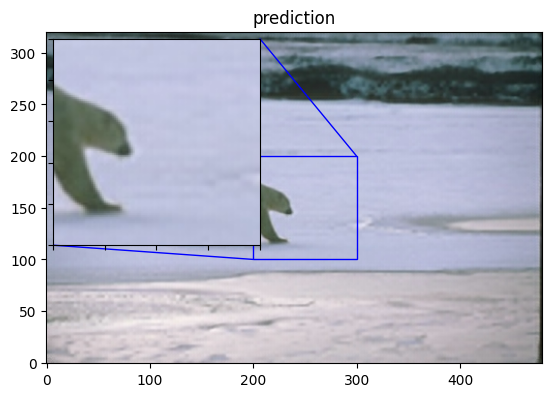

50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 46ms/step
Epoch 142/150
Mean PSNR for epoch: 26.63
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 38ms/step
Epoch 143/150
Mean PSNR for epoch: 26.73
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 43ms/step
Epoch 144/150
Mean PSNR for epoch: 26.69
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 61ms/step
Epoch 145/150
Mean PSNR for epoch: 26.95
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 34ms/step
Epoch 146/150
Mean PSNR for epoch: 26.75
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 31ms/step
Epoch 147/150
Mean PSNR for epoch: 26.47
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 32ms/step
Epoch 148/150
Mean PSNR for epoch: 27.01
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 37ms/step
Epoch 149/150
Mean PSNR for epoch: 26.67
50/50 - 3s - loss: 0.0024 - val_loss: 0.0022 - 3s/epoch - 58ms/step
Epoch 150/150
Mean PSNR for epoch: 26.77
50/50 - 2s - loss: 

In [ ]:
epochs = 150

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

1/1 [==============================] - 0s 21ms/step
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.6941


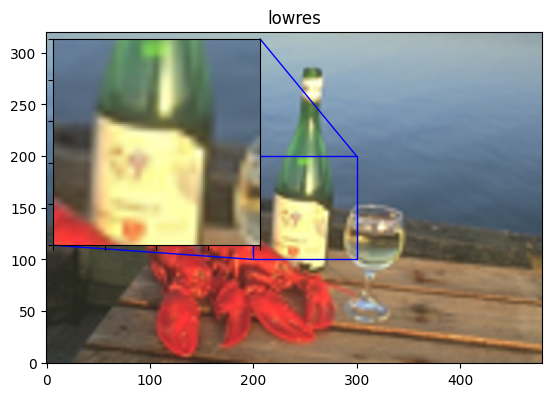

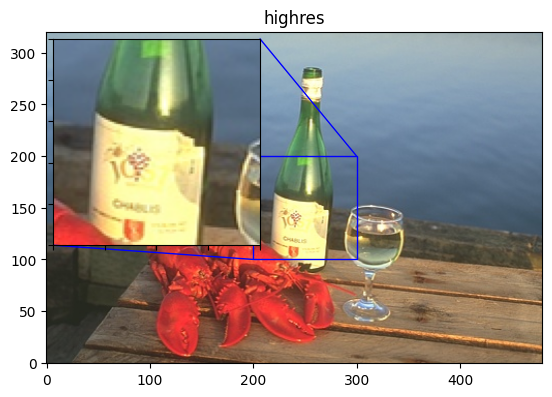

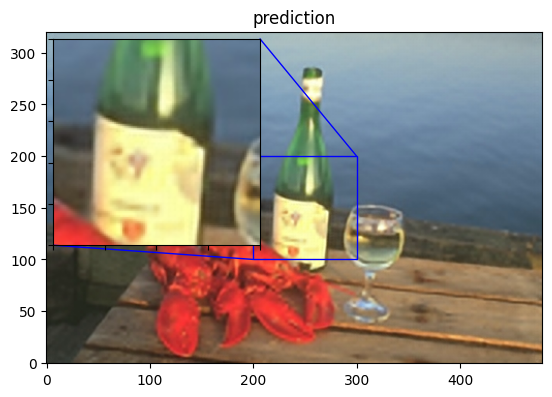

1/1 [==============================] - 0s 17ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 26.1524


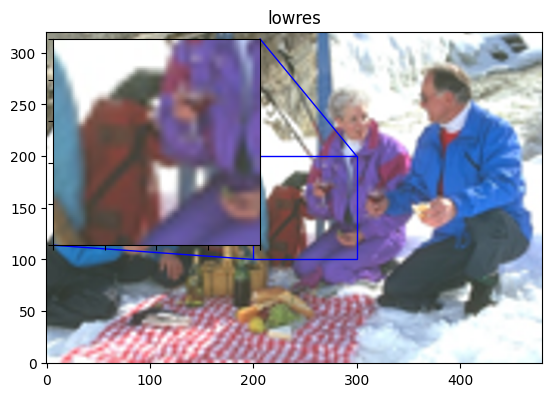

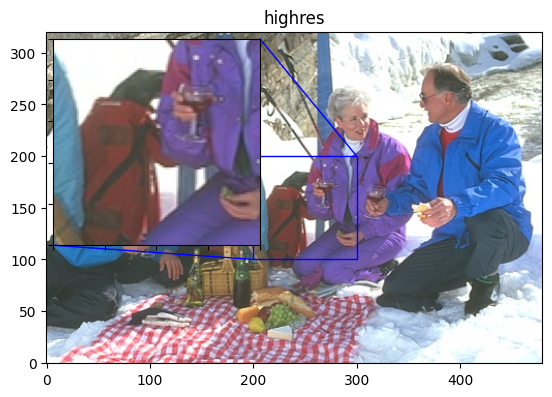

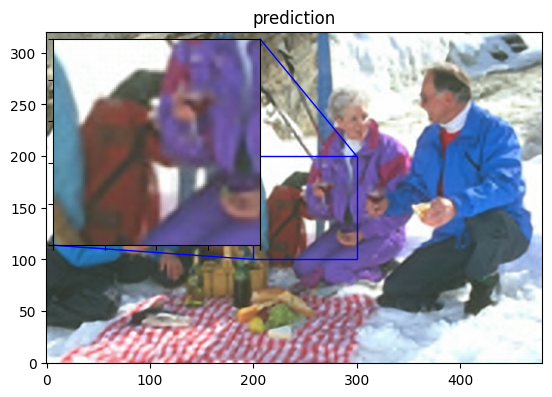

1/1 [==============================] - 0s 255ms/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.4175


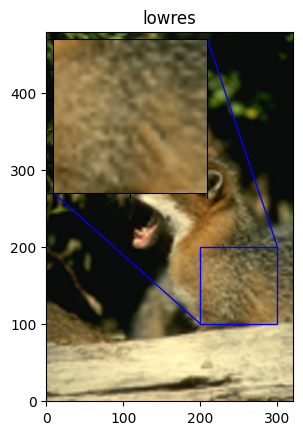

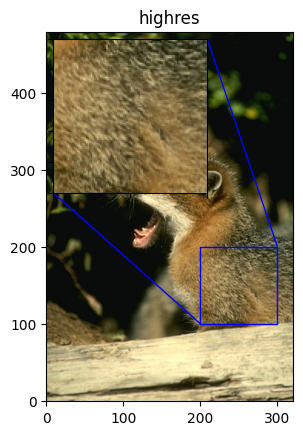

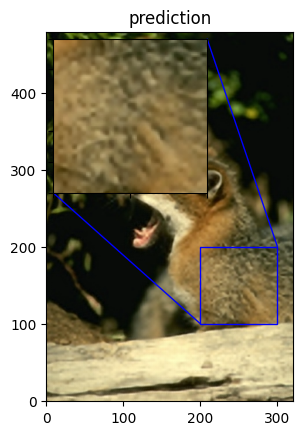

1/1 [==============================] - 0s 27ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2739


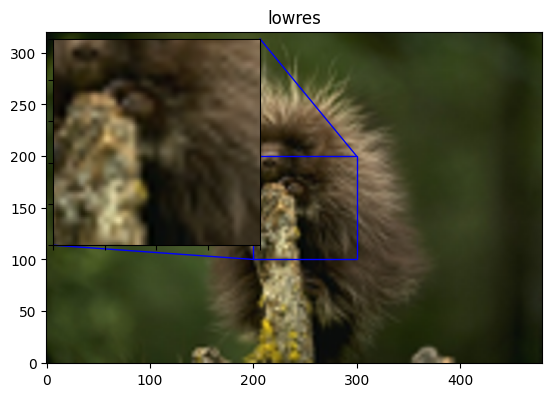

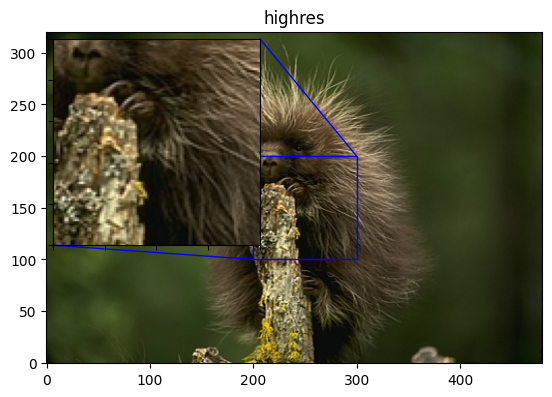

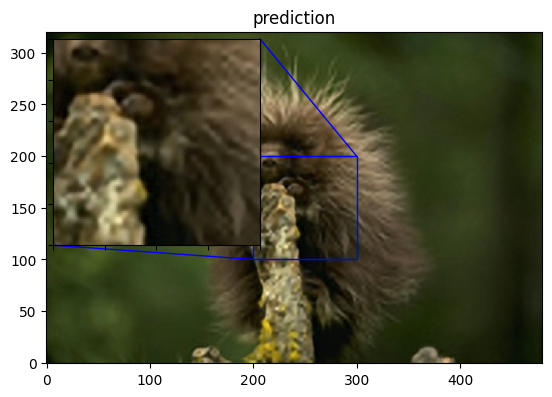

1/1 [==============================] - 0s 47ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.3966


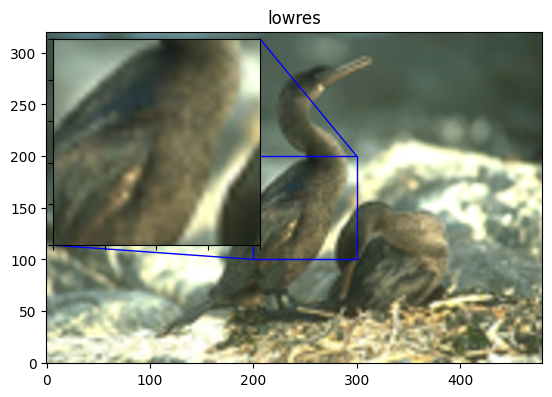

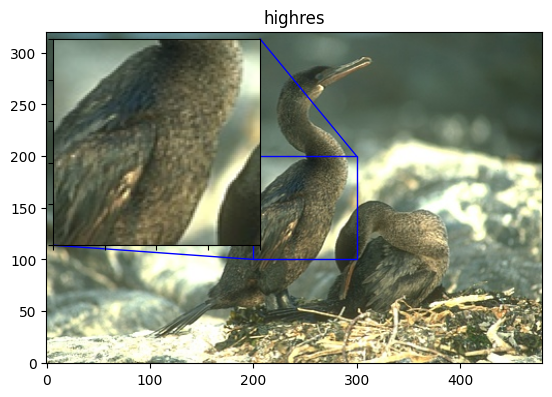

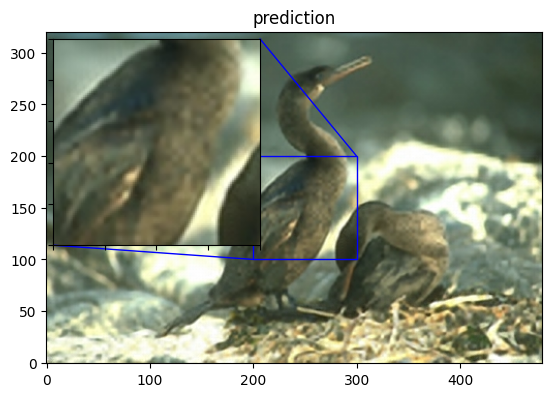

1/1 [==============================] - 0s 33ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.7889


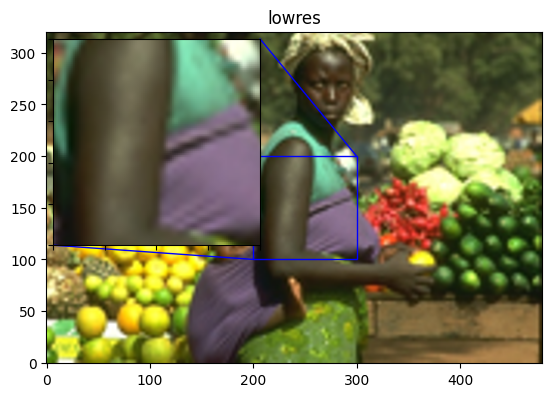

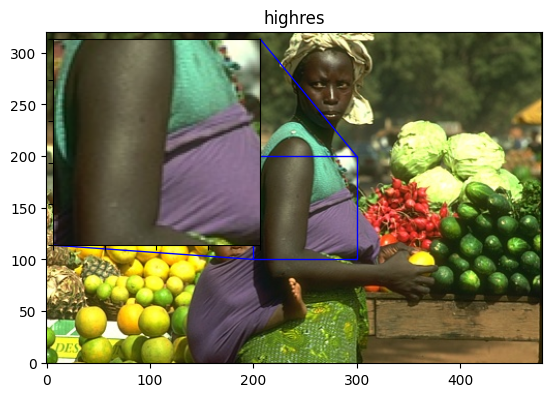

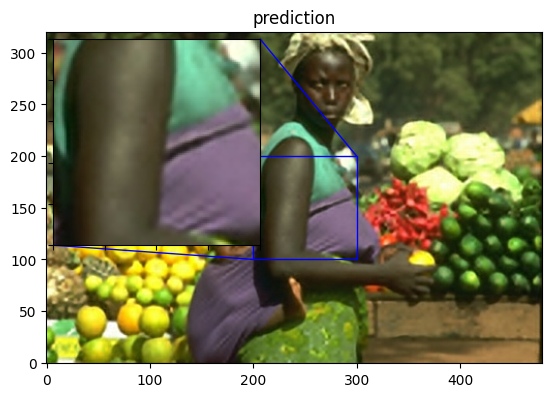

1/1 [==============================] - 0s 26ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 27.1837


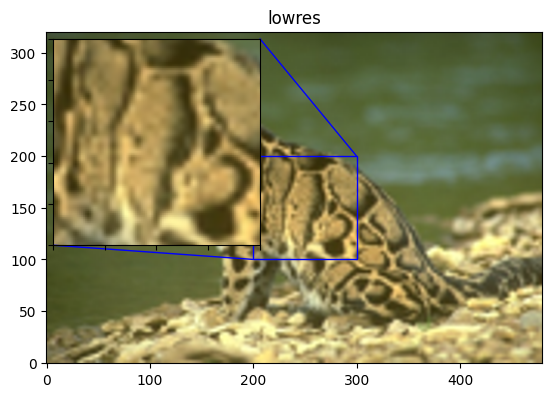

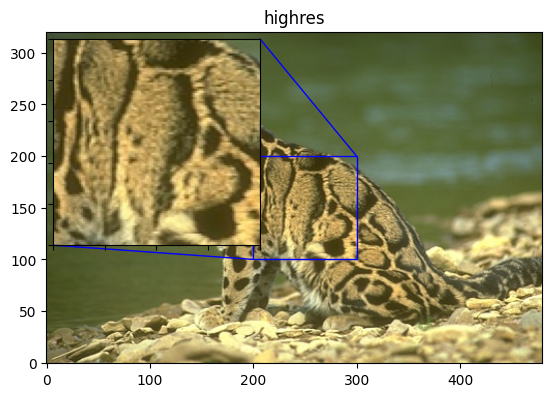

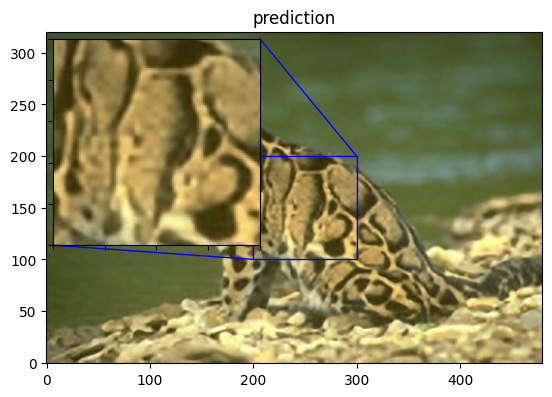

1/1 [==============================] - 0s 26ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.7213


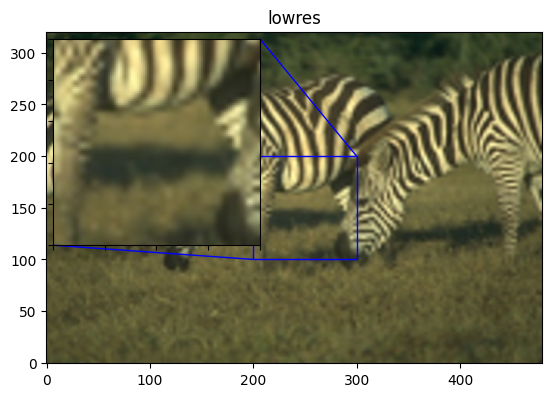

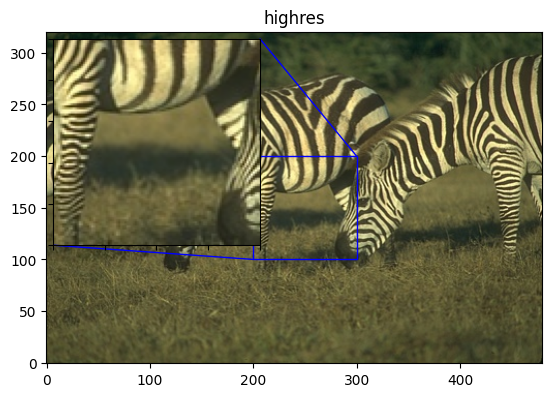

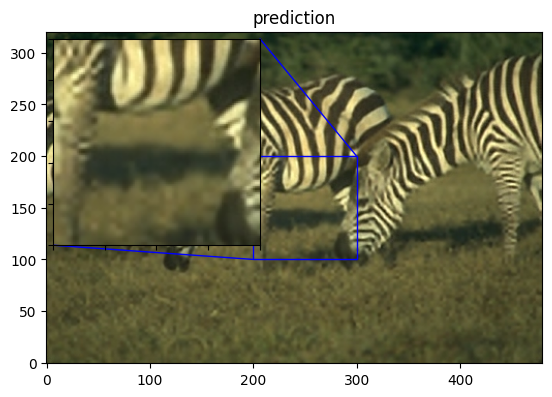

1/1 [==============================] - 0s 34ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.1047


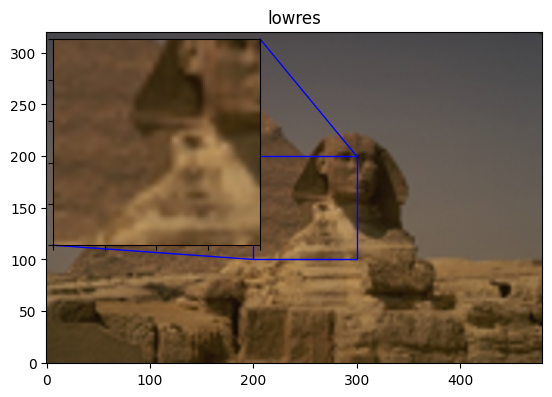

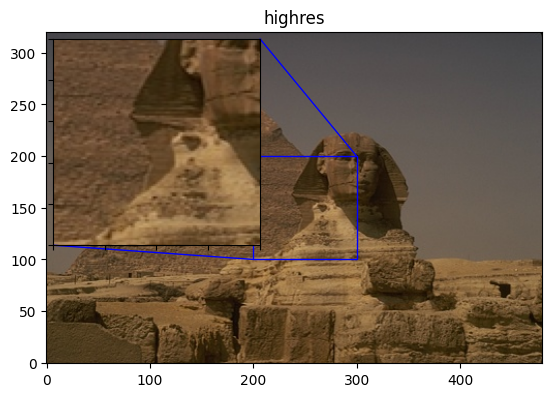

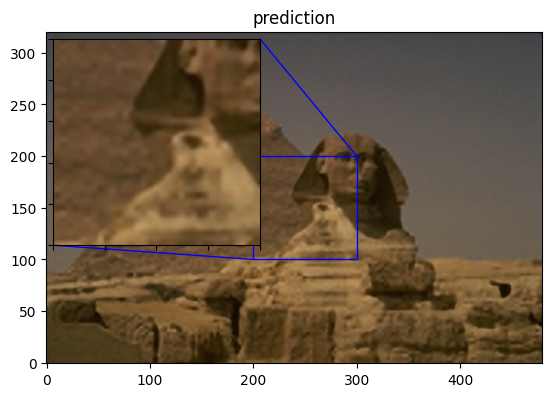

1/1 [==============================] - 0s 45ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.8069


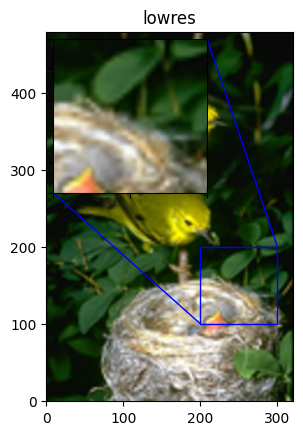

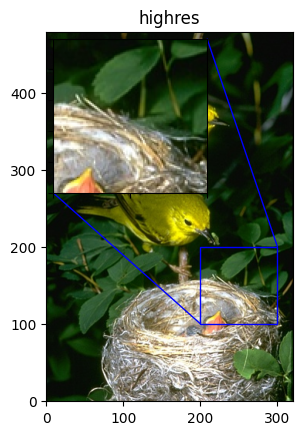

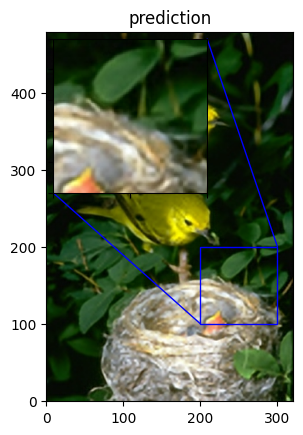

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.4540


In [ ]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
model_save_path = '/content/gdrive/MyDrive/Colab Notebooks/Models/image_upscale_model'
model.save(model_save_path)


## With Pre Trained Model

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


PSNR of low resolution image and high resolution image is 30.4226
PSNR of predict and high resolution is 27.6885


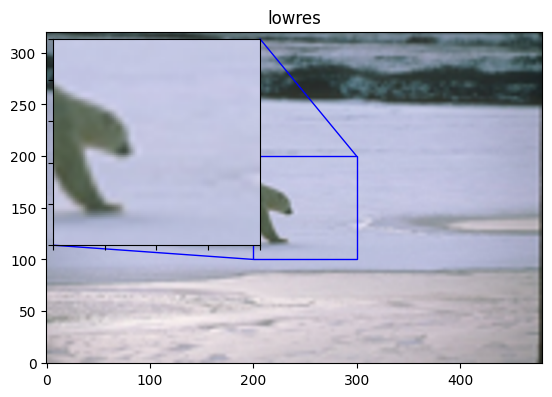

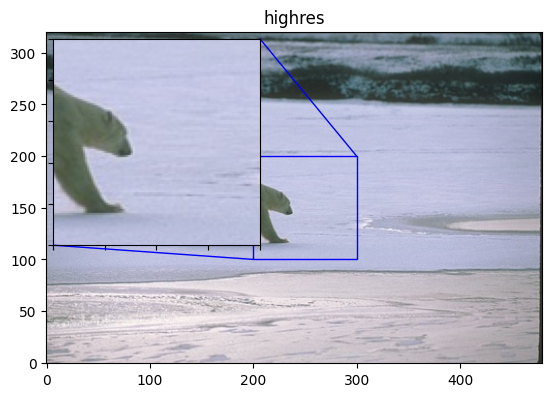

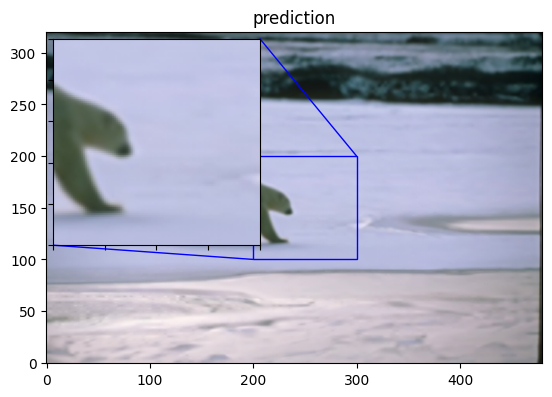

PSNR of low resolution image and high resolution image is 23.0361
PSNR of predict and high resolution is 21.2658


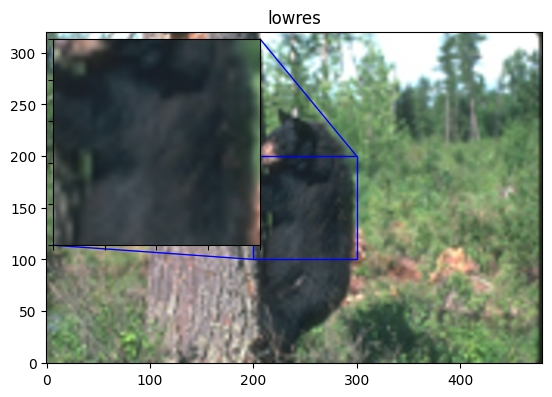

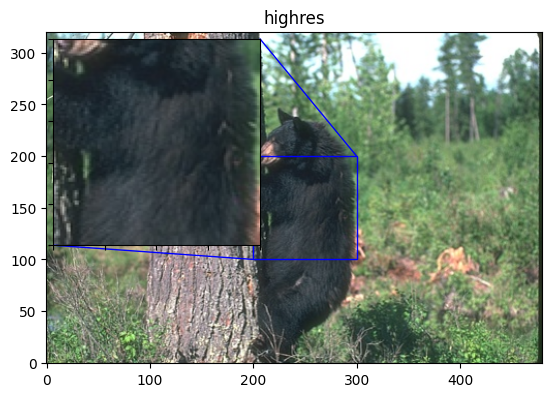

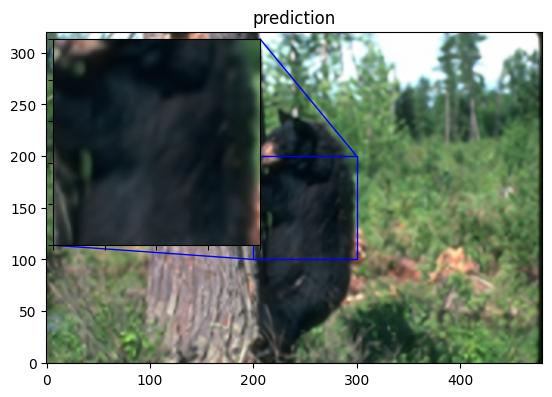

PSNR of low resolution image and high resolution image is 33.8237
PSNR of predict and high resolution is 27.1327


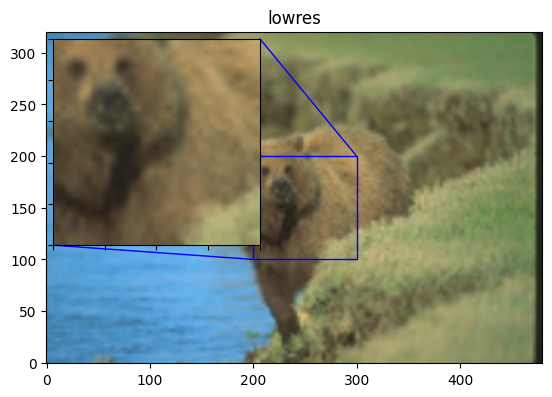

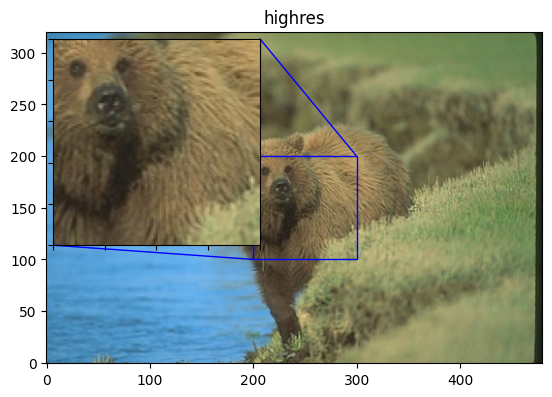

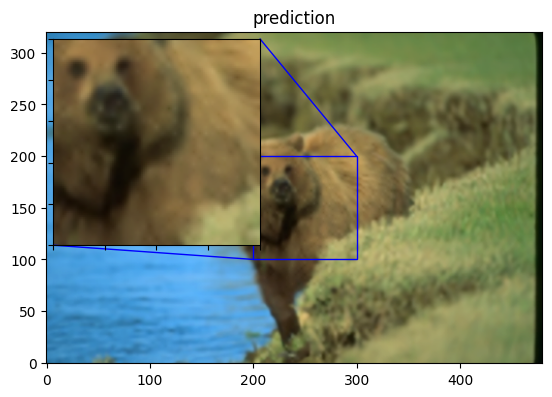

PSNR of low resolution image and high resolution image is 27.8513
PSNR of predict and high resolution is 28.9579


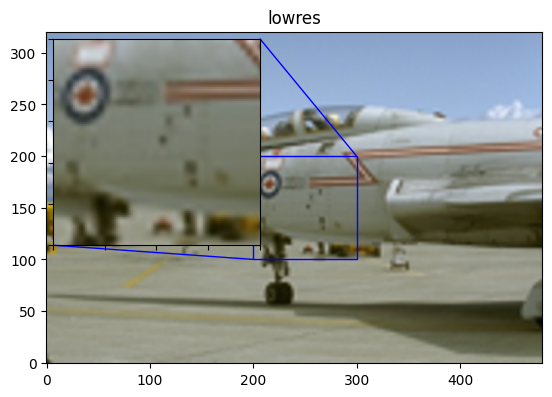

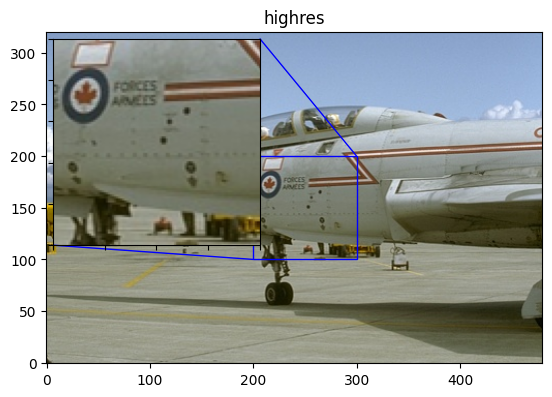

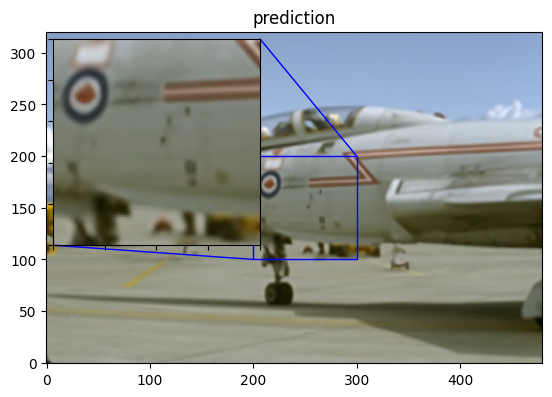

PSNR of low resolution image and high resolution image is 22.7229
PSNR of predict and high resolution is 22.7013


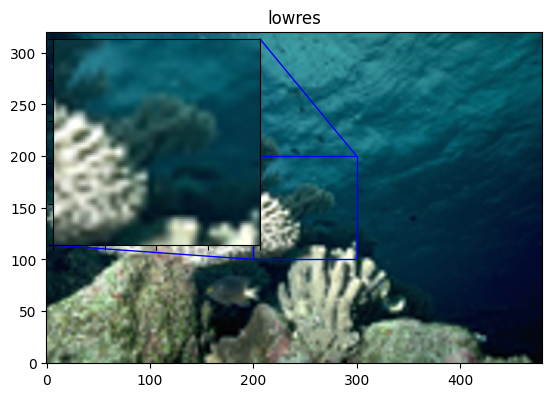

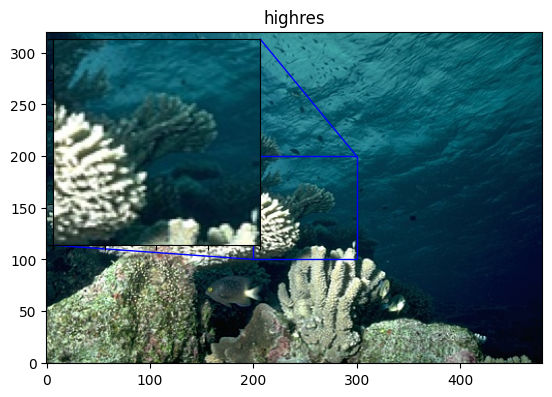

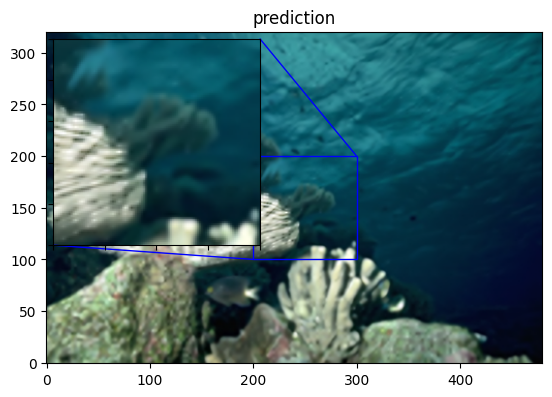

Avg. PSNR of lowres images is 40.5214
Avg. PSNR of reconstructions is 40.1864


In [ ]:
import cv2
from cv2 import dnn_superres
sr = dnn_superres.DnnSuperResImpl_create()
sr.readModel("/content/gdrive/MyDrive/Colab Notebooks/Models/pre_trained/EDSR_x4.pb")
sr.setModel("edsr", 4)

def upscale_image(superres_model, img, target_shape):
    # Convert the PIL image to a NumPy array
    img_array = img_to_array(img)
    img_array = img_array.astype("uint8")

    # Upscale the image using the dnn_superres module
    hr_image = superres_model.upsample(img_array)

    # Resize the upscaled image to the target shape
    hr_image = cv2.resize(hr_image, target_shape, interpolation=cv2.INTER_CUBIC)

    # Convert the NumPy array back to a PIL image
    hr_image_pil = array_to_img(hr_image)

    return hr_image_pil

for index, test_img_path in enumerate(test_img_paths[0:5]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))

    # Upscale the image using the OpenCV Super Resolution model
    prediction = upscale_image(sr, lowres_input, target_shape=(w, h))

    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print("PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr)
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

